In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("..")

In [3]:
# Python
from pathlib import Path
import os
import warnings
import math
import datetime
import time
import pickle
warnings.filterwarnings('ignore')

# Extern
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision
from dotted_dict import DottedDict
import matplotlib.pyplot as plt
from tqdm import tqdm
import pprint
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import torchvision.transforms as transforms
import pprint

# Local
from BTwins.utils import *
from UNet.unet import UNet
from csprites.datasets import SegmentationDataset, ClassificationDataset
import utils
from optimizer import get_optimizer
from BTwins.transform_utils import *

import torch.nn as nn
from UNet.unet import *

In [4]:
x = [8, 16, 32, 64, 128, 256, 512]
print(x[::-1])

[512, 256, 128, 64, 32, 16, 8]


In [5]:
config = {
    'device': 'cuda',
    'cuda_visible_devices': '0',
    'p_data': "/mnt/data/csprites/single_csprites_64x64_n7_c128_a32_p10_s3_bg_inf_random_function_100000",
    'target_variable': 'shape',
    'batch_size': 512,
    'num_workers': 6,
    'num_epochs': 100,
    'freqs': {
        'ckpt': 50,         # epochs
        'show': 1,
        'linprob': 1
    },
    'n_vis': 16,
    'unet_model': {
        'chs_tail': [3, 8],
        'chs_down': [8, 16, 32, 64, 128, 256, 512],
        'chs_up': [512, 256, 128, 64, 32, 16, 8],
        'chs_head': [8, 1],
        'n_conv_blocks': 1,
        'activation_last': "relu"
    },
    'barlow_model': {
        'w_stl': 0.5,
        'w_geo': 0.5,
        'proj_geo_depth': 1,
        'proj_stl_depth': 3,
        'proj_geo_width': 1,
        'proj_stl_width': 4,
        'scale_factor': 1,
        'lambd_stl': None,
        'lambd_geo': None,
    },
    'optimizer': 'adam',
    'optimizer_args': {
        'lr': 0.001,
        'weight_decay': 1e-6
    },
    'p_ckpts': "ckpts",
    'p_model': "model_{}.ckpt",
    'p_stats': "stats.pkl",
    'p_config': 'config.pkl',
    'p_R_train': 'R_train.npy',
    'p_R_valid': 'R_valid.npy',
    'p_Y_valid': 'Y_valid.npy',
    'p_Y_train': 'Y_train.npy',
    'linprob': {
        'optimizer': 'adam',
        'optimizer_args': {
            'lr': 0.001,
            'weight_decay': 1e-6
        },
        'n_hid': 0,
        'd_hid': 1024,
        'num_epochs': 1
    }
    
}
p_base = Path("/mnt/experiments/csprites") / Path(config["p_data"]).name / "tmp"
ts = time.time()
st = datetime.datetime.fromtimestamp(ts).strftime('%Y-%m-%d_%H-%M-%S')
#
config["p_experiment"] = str(p_base / "BarlowUNet_{}".format(st))
config = DottedDict(config)
pprint.pprint(config)

{'barlow_model': {'lambd_geo': None,
                  'lambd_stl': None,
                  'proj_geo_depth': 1,
                  'proj_geo_width': 1,
                  'proj_stl_depth': 3,
                  'proj_stl_width': 4,
                  'scale_factor': 1,
                  'w_geo': 0.5,
                  'w_stl': 0.5},
 'batch_size': 512,
 'cuda_visible_devices': '0',
 'device': 'cuda',
 'freqs': DottedDict({'ckpt': 50, 'show': 1, 'linprob': 1}),
 'linprob': {'d_hid': 1024,
             'n_hid': 0,
             'num_epochs': 1,
             'optimizer': 'adam',
             'optimizer_args': {'lr': 0.001,
                                'weight_decay': 1e-06}},
 'n_vis': 16,
 'num_epochs': 100,
 'num_workers': 6,
 'optimizer': 'adam',
 'optimizer_args': DottedDict({'lr': 0.001, 'weight_decay': 1e-06}),
 'p_R_train': 'R_train.npy',
 'p_R_valid': 'R_valid.npy',
 'p_Y_train': 'Y_train.npy',
 'p_Y_valid': 'Y_valid.npy',
 'p_ckpts': 'ckpts',
 'p_config': 'config.pkl',
 'p_data': 

In [6]:
# TORCH SETTINGS
torch.backends.cudnn.benchmark = True
os.environ["CUDA_VISIBLE_DEVICES"] = config.cuda_visible_devices
device = torch.device(config.device)

# Dataset

In [7]:
p_ds_config = Path(config.p_data) / "config.pkl"

with open(p_ds_config, "rb") as file:
    ds_config = pickle.load(file)
#
target_variable = config.target_variable
target_idx = [idx for idx, target in enumerate(ds_config["classes"]) if target == target_variable][0]
n_classes = ds_config["n_classes"][target_variable]

In [8]:
norm_transform = utils.normalize_transform(
    ds_config["means"],
    ds_config["stds"])
inverse_norm_transform = utils.inverse_normalize_transform(
    ds_config["means"],
    ds_config["stds"]
)
target_transform = lambda x: x[target_idx]
#
stl_transform = transforms.Compose([
                transforms.RandomApply(
                    [transforms.ColorJitter(brightness=0.4, contrast=0.4,
                                            saturation=0.2, hue=0.1)],
                    p=0.8
                ),
                transforms.RandomGrayscale(p=0.2),
                GaussianBlur(p=0.5),
                Solarization(p=0.2)
])
fin_transform = transforms.Compose([
                transforms.ToTensor(),
                norm_transform
            ])

train_transform = CSpritesTransform(
    img_size=ds_config["img_size"],
    scale=(0.6, 1.0),
    ratio=(1, 1),
    p_hflip=(0.5),
    p_vflip=(0.5),
    stl_transform=stl_transform,
    fin_transform=fin_transform)

transform_linprob = transforms.Compose([
                transforms.Resize(ds_config["img_size"]),
                transforms.ToTensor(),
                norm_transform
            ])

transform_segm = transforms.Compose([
    transforms.ToTensor(),
    lambda x: (x > 0).float()
])

In [9]:
# TRAIN
ds_train = ClassificationDataset(
    p_data = config.p_data,
    transform=train_transform,
    target_transform=target_transform,
    split="train"
)
dl_train = DataLoader(
    ds_train,
    batch_size=config.batch_size,
    shuffle=True,
    num_workers=config.num_workers,
    pin_memory=False,
    drop_last=True
)
# LINPROB
ds_linprob = ClassificationDataset(
    p_data = config.p_data,
    transform=transform_linprob,
    target_transform=target_transform,
    split="valid"
)
dl_linprob = DataLoader(
    ds_linprob,
    batch_size=config.batch_size,
    shuffle=True,
    num_workers = config.num_workers,
    pin_memory=False
)

# Visualize

In [10]:
n_vis = 4 #config.num_vis

In [11]:
# dl_train
(x11, x12, x21, x22),_ = next(iter(dl_train))

In [12]:
x11 = inverse_norm_transform(x11[:n_vis])
x12 = inverse_norm_transform(x12[:n_vis])
x21 = inverse_norm_transform(x21[:n_vis])
x22 = inverse_norm_transform(x22[:n_vis])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


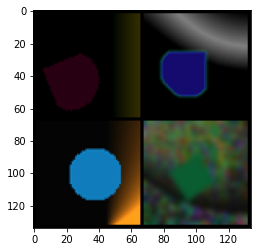

In [13]:
grid_img = torchvision.utils.make_grid(x11, nrow=int(np.sqrt(n_vis)))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


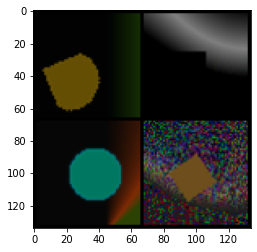

In [14]:
grid_img = torchvision.utils.make_grid(x12, nrow=int(np.sqrt(n_vis)))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


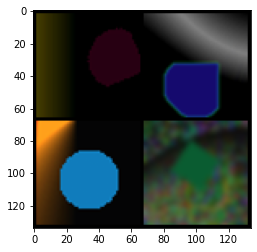

In [15]:
grid_img = torchvision.utils.make_grid(x21, nrow=int(np.sqrt(n_vis)))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


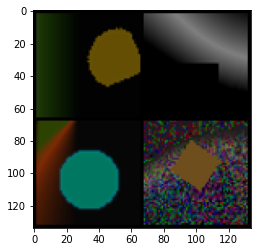

In [16]:
grid_img = torchvision.utils.make_grid(x22, nrow=int(np.sqrt(n_vis)))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['ellipse', 'pyramid', 'pyramid', 'square']


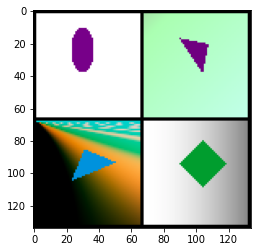

In [17]:
# dl_linprob_train
x,y = next(iter(dl_linprob))
x = x[:n_vis]
y = y[:n_vis]
#
x = inverse_norm_transform(x)
#
grid_img = torchvision.utils.make_grid(x, nrow=int(np.sqrt(n_vis)))
plt.imshow(grid_img.permute(1, 2, 0))
#
y = [ds_config["class_maps"]["shape"][idx.item()] for idx in y]
print(y)

# Model

In [18]:
class BarlowUNet(nn.Module):
    def __init__(self, chs_tail, chs_down, chs_up, chs_head, n_conv_blocks, activation_last):
        super().__init__()
        self.chs_tail = chs_tail
        self.chs_down = chs_down
        self.chs_up = chs_up
        self.chs_head = chs_head
        self.n_conv_blocks = n_conv_blocks
        self.encoder = Encoder(chs_tail, chs_down, n_conv_blocks)
        self.decoder = Decoder(chs_head, chs_up, n_conv_blocks, activation_last)
    
    def forward(self, x):
        zz = self.encoder(x)
        z_stl = zz[-1]
        z_geo = self.decoder(zz[::-1])
        return z_stl, z_geo, zz

class FFProjector(nn.Module):
    def __init__(self, d_in, d_out, n_layers=1):
        super().__init__()
        
        assert n_layers >= 0
        
        self.d_in = d_in
        self.d_out = d_out
        self.n_layers = n_layers
        #
        dims = [d_in] + [d_out] * n_layers
        layers = []
        for i in range(len(dims) - 1):
            layers.extend([
                nn.Linear(dims[i], dims[i + 1], bias=False),
                nn.BatchNorm1d(dims[i + 1]),
                nn.ReLU(inplace=True),
            ])
        layers.append(nn.BatchNorm1d(dims[-1], affine=False))
        self.projector = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.projector(x)

def off_diagonal(x):
    # return a flattened view of the off-diagonal elements of a square matrix
    n, m = x.shape
    assert n == m
    return x.flatten()[:-1].view(n - 1, n + 1)[:, 1:].flatten()
        
class BarlowUNetWrapper(nn.Module):
    def __init__(self, unet, img_size, 
                 proj_geo_depth=1, proj_stl_depth=1,
                 proj_geo_width=1, proj_stl_width=2,
                 scale_factor = 1,
                 lambd_stl = None,
                 lambd_geo = None,
                 w_stl = 0.5,
                 w_geo = 0.5
                ):
        
        super().__init__()
        self.proj_geo_depth = proj_geo_depth
        self.proj_stl_depth = proj_stl_depth
        self.proj_geo_width = proj_geo_width
        self.proj_stl_width = proj_stl_width
        self.unet = unet
        self.img_size = img_size
        self.scale_factor = scale_factor
        self.w_stl = w_stl
        self.w_geo = w_geo
        self.lambd_stl = lambd_stl
        self.lambd_geo = lambd_geo
        #
        self.initialize()
    
    def initialize(self):
        self.c_stl = self.img_size // (2**(len(self.unet.chs_down) -1))
        self.d_stl = self.unet.chs_down[-1] * self.c_stl
        self.d_geo = self.unet.chs_head[-1] * self.img_size ** 2
        #
        self.projector_geo = FFProjector(
            d_in = self.d_geo,
            d_out = self.d_geo * self.proj_geo_width,
            n_layers = self.proj_geo_depth
        )
        #
        self.projector_stl = FFProjector(
            d_in = self.d_stl,
            d_out = self.d_stl * self.proj_stl_width,
            n_layers = self.proj_stl_depth
        )
        if self.lambd_stl is None:
            self.lambd_stl = calc_lambda(self.d_stl * self.proj_stl_width)
        if self.lambd_geo is None:
            self.lambd_geo = calc_lambda(self.d_geo * self.proj_geo_width)

    def barlow_stl_loss(self, z1, z2):
        # empirical cross-correlation matrix
        c = z1.T @ z2

        # sum the cross-correlation matrix between all gpus
        c.div_(z1.shape[0])

        on_diag = torch.diagonal(c).add_(-1).pow_(2).sum()
        off_diag = off_diagonal(c).pow_(2).sum()
        loss = self.scale_factor * (on_diag + self.lambd_stl * off_diag)
        return loss

    def barlow_geo_loss(self, z1, z2):
        # empirical cross-correlation matrix
        c = z1.T @ z2

        # sum the cross-correlation matrix between all gpus
        c.div_(z1.shape[0])

        on_diag = torch.diagonal(c).add_(-1).pow_(2).sum()
        off_diag = off_diagonal(c).pow_(2).sum()
        loss = self.scale_factor * (on_diag + self.lambd_geo * off_diag)
        return loss

    def forward(self, x11, x12, x21, x22):
        """
        same geo: (x11, x12), (x21, x22)
        same stl: (x11, x21), (x12, x22)
        """
        z11_stl, z11_geo, _ = self.unet(x11)
        z12_stl, z12_geo, _ = self.unet(x12)
        z21_stl, z21_geo, _ = self.unet(x21)
        z22_stl, z22_geo, _ = self.unet(x22)
        #
        z11_stl = self.projector_stl(z11_stl.flatten(start_dim=1))
        z11_geo = self.projector_geo(z11_geo.flatten(start_dim=1))
        #
        z12_stl = self.projector_stl(z12_stl.flatten(start_dim=1))
        z12_geo = self.projector_geo(z12_geo.flatten(start_dim=1))
        #
        z21_stl = self.projector_stl(z21_stl.flatten(start_dim=1))
        z21_geo = self.projector_geo(z21_geo.flatten(start_dim=1))        
        #
        z22_stl = self.projector_stl(z22_stl.flatten(start_dim=1))
        z22_geo = self.projector_geo(z22_geo.flatten(start_dim=1))
        
        # GEO LOSS
        geo_1112_loss = self.barlow_geo_loss(z11_geo, z12_geo) * self.w_geo
        geo_2122_loss = self.barlow_geo_loss(z21_geo, z22_geo) * self.w_geo

        # STL LOSS
        stl_1121_loss = self.barlow_stl_loss(z11_stl, z21_stl) * self.w_stl
        stl_1222_loss = self.barlow_stl_loss(z12_stl, z22_stl) * self.w_stl
        
        loss = 0.25 * (geo_1112_loss + geo_2122_loss +
                       stl_1121_loss + stl_1222_loss)
        return loss, geo_1112_loss, geo_2122_loss, stl_1121_loss, stl_1222_loss

# Test Pipeline

In [19]:
unet = BarlowUNet(
    config.unet_model.chs_tail,
    config.unet_model.chs_down,
    config.unet_model.chs_up,
    config.unet_model.chs_head,
    config.unet_model.n_conv_blocks,
    config.unet_model.activation_last
)
print(unet)
print("#params", utils.count_parameters(unet))

BarlowUNet(
  (encoder): Encoder(
    (tail): BasicConvBlock(
      (convs): Sequential(
        (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (down_blocks): ModuleList(
      (0): DownBlock(
        (maxpol): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (convs): BasicConvBlock(
          (convs): Sequential(
            (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
          )
        )
      )
      (1): DownBlock(
        (maxpol): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (convs): BasicConvBlock(
          (convs): Sequential(
            (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1,

In [20]:
model = BarlowUNetWrapper(
    unet,
    img_size=ds_config["img_size"],
    proj_geo_depth = config.barlow_model.proj_geo_depth,
    proj_stl_depth = config.barlow_model.proj_stl_depth,
    proj_geo_width = config.barlow_model.proj_geo_width,
    proj_stl_width = config.barlow_model.proj_stl_width,
    w_stl = config.barlow_model.w_stl,
    w_geo = config.barlow_model.w_geo,
    lambd_geo = config.barlow_model.lambd_geo,
    lambd_stl = config.barlow_model.lambd_stl 
)
model

BarlowUNetWrapper(
  (unet): BarlowUNet(
    (encoder): Encoder(
      (tail): BasicConvBlock(
        (convs): Sequential(
          (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
      )
      (down_blocks): ModuleList(
        (0): DownBlock(
          (maxpol): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
          (convs): BasicConvBlock(
            (convs): Sequential(
              (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
          )
        )
        (1): DownBlock(
          (maxpol): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
          (convs): BasicConvBlock(
            (convs):

In [21]:
(x11, x12, x21, x22), y = next(iter(dl_train))

In [22]:
z_stl, z_geo, zz = unet(x11)

In [23]:
loss, geo_1112_loss, geo_2122_loss, stl_1121_loss, stl_1222_loss = model(x11, x12, x21, x22)

In [24]:
print(model.lambd_geo)
print(model.lambd_stl)
print(model.w_geo)
print(model.w_stl)
print(model.d_geo)
print(model.d_stl)
print(model.proj_geo_depth)
print(model.proj_stl_depth)
print(model.proj_geo_width)
print(model.proj_stl_width)

0.010008206729518205
0.02002130266603666
0.5
0.5
4096
512
1
3
1
4


# Vis

In [25]:
x, y = next(iter(dl_linprob))
x_vis = x[:config.n_vis]
#
z_stl, z_geo, _ = model.unet(x_vis)

In [26]:
def visualize(x, z_geo, n_vis=4):
    x = inverse_norm_transform(x).cpu()[:n_vis]
    z_geo = z_geo.detach().cpu()[:n_vis]
    #
    img_x = torchvision.utils.make_grid(x, ncol=1).permute(1, 2, 0)
    img_z = torchvision.utils.make_grid(z_geo, ncol=1).permute(1, 2, 0)
    #
    plt.imshow(img_x)
    plt.show()
    
    #
    plt.imshow(img_z)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


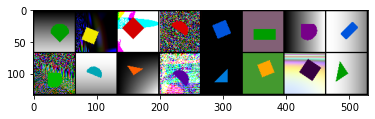

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


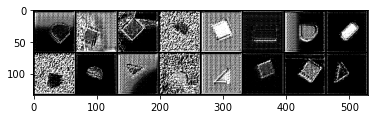

In [27]:
visualize(x_vis, z_geo, config.n_vis)

# Prepare Train run

In [28]:
unet = BarlowUNet(
    config.unet_model.chs_tail,
    config.unet_model.chs_down,
    config.unet_model.chs_up,
    config.unet_model.chs_head,
    config.unet_model.n_conv_blocks,
    config.unet_model.activation_last
)
model = BarlowUNetWrapper(
    unet,
    img_size=ds_config["img_size"],
    proj_geo_depth = config.barlow_model.proj_geo_depth,
    proj_stl_depth = config.barlow_model.proj_stl_depth,
    proj_geo_width = config.barlow_model.proj_geo_width,
    proj_stl_width = config.barlow_model.proj_stl_width,
    w_stl = config.barlow_model.w_stl,
    w_geo = config.barlow_model.w_geo,
    lambd_geo = config.barlow_model.lambd_geo,
    lambd_stl = config.barlow_model.lambd_stl 
)
if torch.cuda.device_count() > 1 and device != "cpu":
    print("Using {} gpus!".format(torch.cuda.device_count()))
    model = torch.nn.DataParallel(model)
    model.backbone = model.module.backbone
elif device != "cpu":
    print("Using 1 GPU!")
else:
    print("Using CPU!")
model = model.to(device)

Using 1 GPU!


In [29]:
optimizer = get_optimizer(config.optimizer, model.parameters(), config.optimizer_args)

In [30]:
stats = {
    'train': {
        'loss': [],
        'epoch': [],
    },
    'linprob': {
        'linacc': [],
        'knnacc': [],
        'epoch': [],
    }
}
stats = DottedDict(stats)
#
p_experiment = Path(config.p_experiment)
p_experiment.mkdir(exist_ok=True, parents=True)
p_ckpts = p_experiment / config.p_ckpts
p_ckpts.mkdir(exist_ok=True)

In [31]:
config.p_experiment

'/mnt/experiments/csprites/single_csprites_64x64_n7_c128_a32_p10_s3_bg_inf_random_function_100000/tmp/BarlowUNet_2021-08-24_18-46-26'

Epoch [  1/100] train:██████████| 175/175 [00:55<00:00,  3.16it/s, loss=798, geo_1=1.04e+3, geo_2=1.05e+3, stl_1=553, stl_2=548] 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


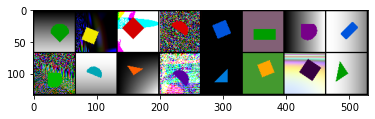

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


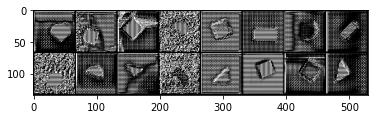

    Linprob Eval @LR: 0.38 @KNN: 0.46


Epoch [  2/100] train:██████████| 175/175 [00:54<00:00,  3.22it/s, loss=682, geo_1=649, geo_2=641, stl_1=720, stl_2=718]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


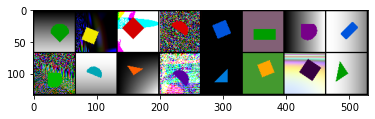

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


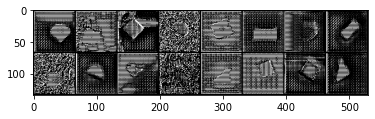

    Linprob Eval @LR: 0.35 @KNN: 0.45


Epoch [  3/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=455, geo_1=447, geo_2=443, stl_1=469, stl_2=459]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


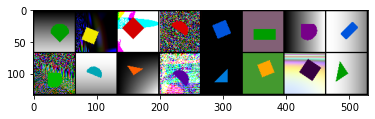

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


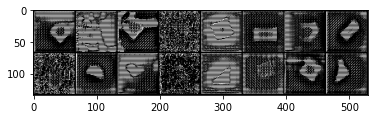

    Linprob Eval @LR: 0.36 @KNN: 0.46


Epoch [  4/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=297, geo_1=378, geo_2=376, stl_1=217, stl_2=219]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


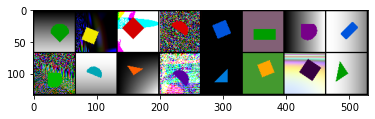

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


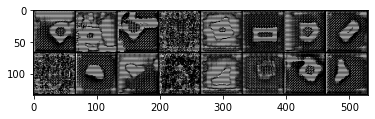

    Linprob Eval @LR: 0.37 @KNN: 0.47


Epoch [  5/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=243, geo_1=329, geo_2=325, stl_1=157, stl_2=159]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


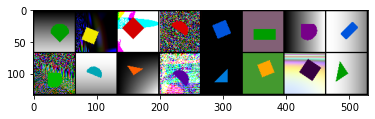

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


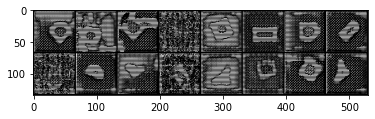

    Linprob Eval @LR: 0.38 @KNN: 0.48


Epoch [  6/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=221, geo_1=301, geo_2=301, stl_1=142, stl_2=139]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


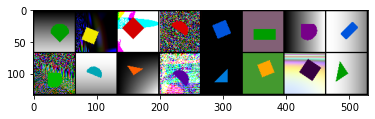

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


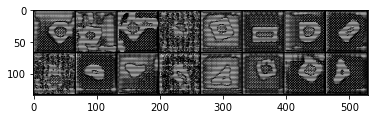

    Linprob Eval @LR: 0.38 @KNN: 0.49


Epoch [  7/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=213, geo_1=290, geo_2=288, stl_1=137, stl_2=136]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


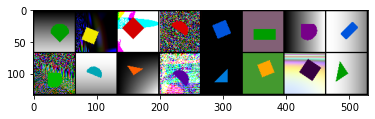

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


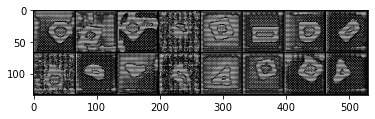

    Linprob Eval @LR: 0.38 @KNN: 0.49


Epoch [  8/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=201, geo_1=264, geo_2=266, stl_1=137, stl_2=136]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


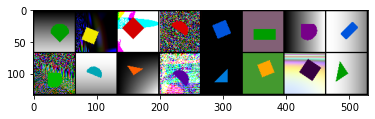

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


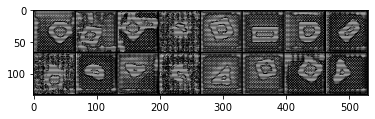

    Linprob Eval @LR: 0.39 @KNN: 0.49


Epoch [  9/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=196, geo_1=265, geo_2=261, stl_1=128, stl_2=131]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


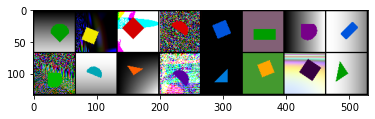

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


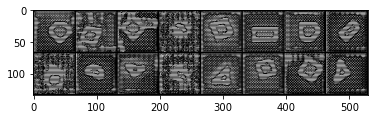

    Linprob Eval @LR: 0.39 @KNN: 0.49


Epoch [ 10/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=185, geo_1=245, geo_2=241, stl_1=128, stl_2=125]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


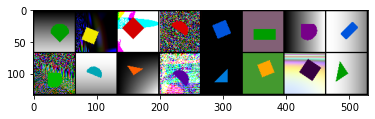

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


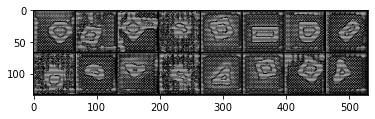

    Linprob Eval @LR: 0.40 @KNN: 0.50


Epoch [ 11/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=186, geo_1=250, geo_2=249, stl_1=124, stl_2=123]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


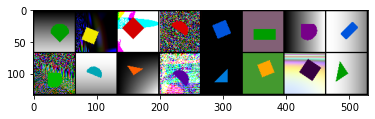

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


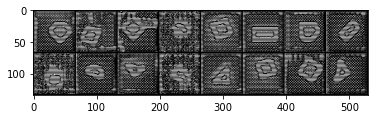

    Linprob Eval @LR: 0.40 @KNN: 0.49


Epoch [ 12/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=183, geo_1=242, geo_2=244, stl_1=124, stl_2=121]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


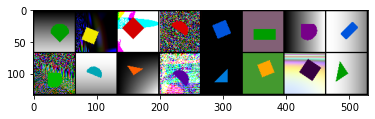

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


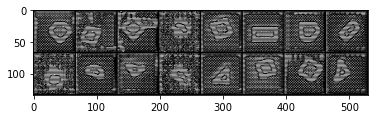

    Linprob Eval @LR: 0.40 @KNN: 0.49


Epoch [ 13/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=176, geo_1=229, geo_2=230, stl_1=121, stl_2=122]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


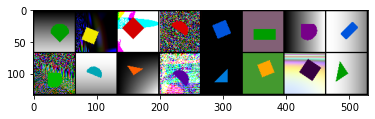

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


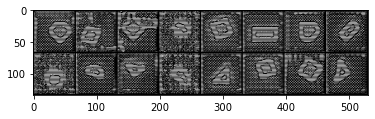

    Linprob Eval @LR: 0.40 @KNN: 0.50


Epoch [ 14/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=174, geo_1=230, geo_2=228, stl_1=117, stl_2=121]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


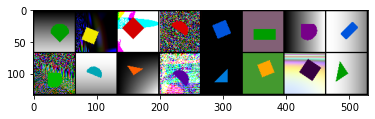

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


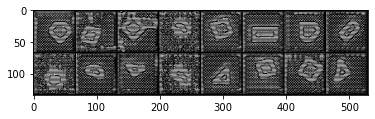

    Linprob Eval @LR: 0.41 @KNN: 0.50


Epoch [ 15/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=171, geo_1=224, geo_2=224, stl_1=117, stl_2=120]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


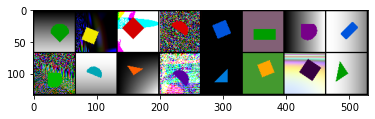

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


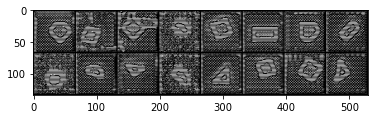

    Linprob Eval @LR: 0.41 @KNN: 0.50


Epoch [ 16/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=171, geo_1=224, geo_2=224, stl_1=119, stl_2=117]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


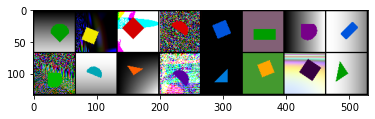

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


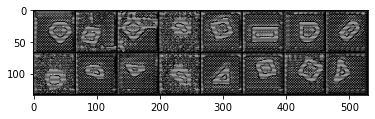

    Linprob Eval @LR: 0.43 @KNN: 0.50


Epoch [ 17/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=166, geo_1=215, geo_2=216, stl_1=116, stl_2=116]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


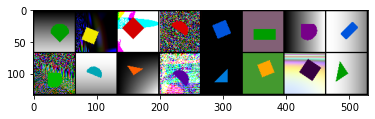

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


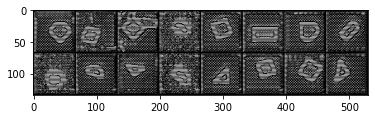

    Linprob Eval @LR: 0.43 @KNN: 0.50


Epoch [ 18/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=166, geo_1=218, geo_2=216, stl_1=116, stl_2=114]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


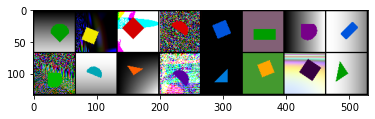

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


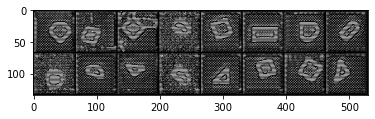

    Linprob Eval @LR: 0.44 @KNN: 0.50


Epoch [ 19/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=163, geo_1=213, geo_2=214, stl_1=113, stl_2=113]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


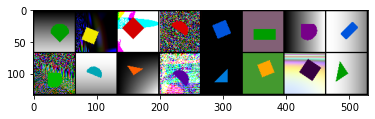

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


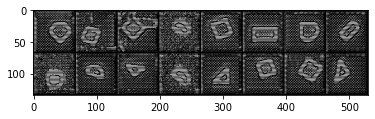

    Linprob Eval @LR: 0.44 @KNN: 0.50


Epoch [ 20/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=164, geo_1=214, geo_2=216, stl_1=113, stl_2=114]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


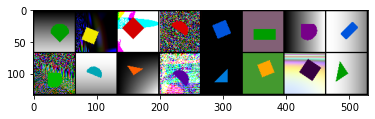

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


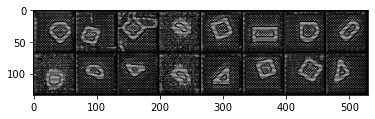

    Linprob Eval @LR: 0.44 @KNN: 0.50


Epoch [ 21/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=162, geo_1=210, geo_2=214, stl_1=111, stl_2=113]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


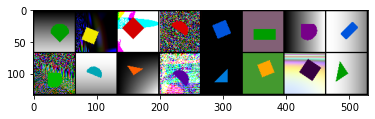

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


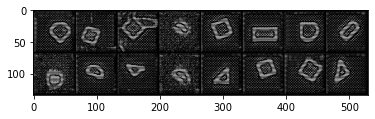

    Linprob Eval @LR: 0.45 @KNN: 0.50


Epoch [ 22/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=162, geo_1=209, geo_2=213, stl_1=112, stl_2=113]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


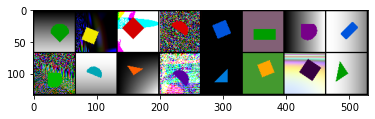

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


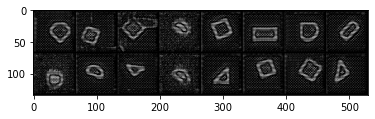

    Linprob Eval @LR: 0.45 @KNN: 0.49


Epoch [ 23/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=161, geo_1=210, geo_2=213, stl_1=111, stl_2=110]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


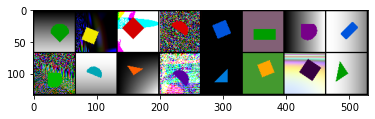

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


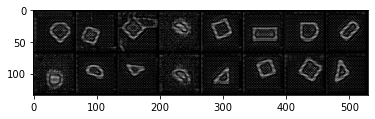

    Linprob Eval @LR: 0.45 @KNN: 0.50


Epoch [ 24/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=159, geo_1=207, geo_2=207, stl_1=111, stl_2=110]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


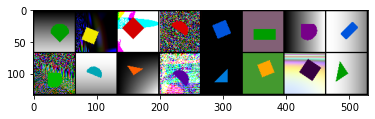

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


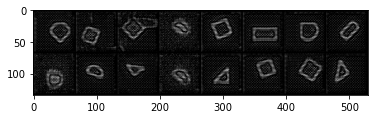

    Linprob Eval @LR: 0.45 @KNN: 0.50


Epoch [ 25/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=157, geo_1=204, geo_2=201, stl_1=112, stl_2=108]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


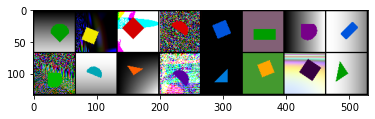

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


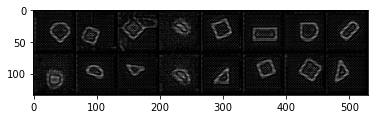

    Linprob Eval @LR: 0.46 @KNN: 0.50


Epoch [ 26/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=157, geo_1=204, geo_2=206, stl_1=110, stl_2=108]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


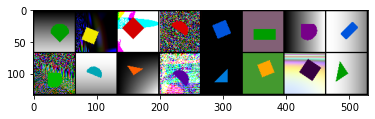

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


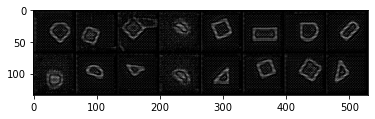

    Linprob Eval @LR: 0.46 @KNN: 0.50


Epoch [ 27/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=156, geo_1=203, geo_2=201, stl_1=110, stl_2=110]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


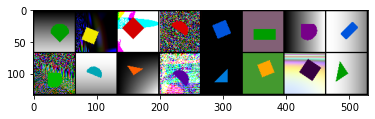

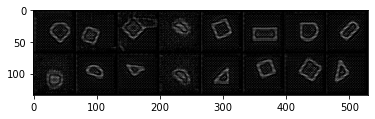

    Linprob Eval @LR: 0.47 @KNN: 0.50


Epoch [ 28/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=154, geo_1=200, geo_2=198, stl_1=107, stl_2=108]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


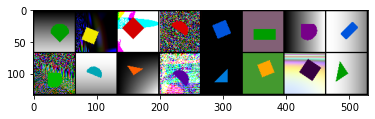

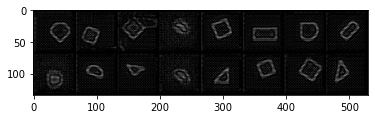

    Linprob Eval @LR: 0.47 @KNN: 0.49


Epoch [ 29/100] train:██████████| 175/175 [00:54<00:00,  3.19it/s, loss=154, geo_1=202, geo_2=202, stl_1=108, stl_2=106]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


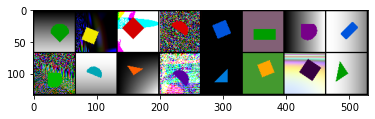

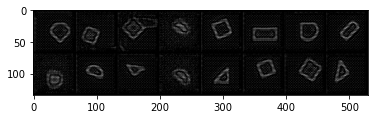

    Linprob Eval @LR: 0.47 @KNN: 0.49


Epoch [ 30/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=155, geo_1=201, geo_2=200, stl_1=110, stl_2=108]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


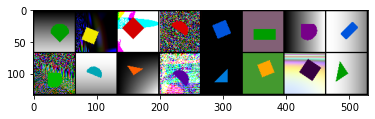

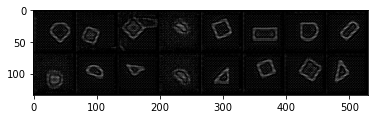

    Linprob Eval @LR: 0.48 @KNN: 0.50


Epoch [ 31/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=153, geo_1=199, geo_2=202, stl_1=108, stl_2=104]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


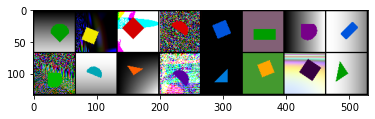

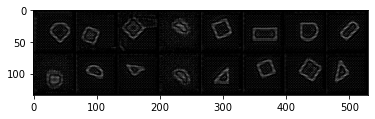

    Linprob Eval @LR: 0.48 @KNN: 0.49


Epoch [ 32/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=154, geo_1=201, geo_2=201, stl_1=107, stl_2=107]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


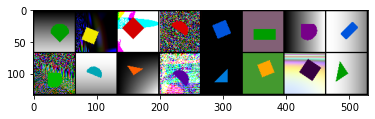

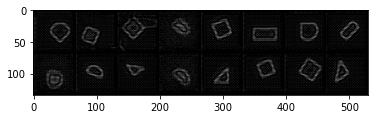

    Linprob Eval @LR: 0.49 @KNN: 0.50


Epoch [ 33/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=151, geo_1=195, geo_2=198, stl_1=105, stl_2=104]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


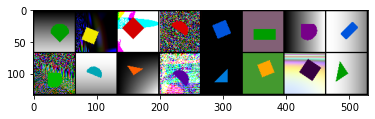

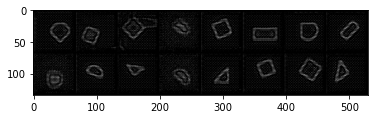

    Linprob Eval @LR: 0.48 @KNN: 0.50


Epoch [ 34/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=149, geo_1=196, geo_2=197, stl_1=102, stl_2=103]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


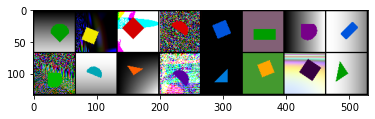

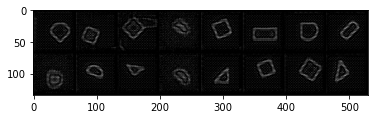

    Linprob Eval @LR: 0.49 @KNN: 0.50


Epoch [ 35/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=152, geo_1=197, geo_2=198, stl_1=106, stl_2=106]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


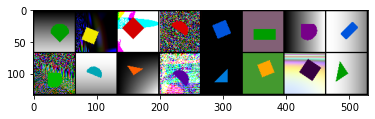

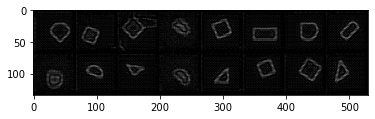

    Linprob Eval @LR: 0.49 @KNN: 0.50


Epoch [ 36/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=148, geo_1=190, geo_2=191, stl_1=105, stl_2=105]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


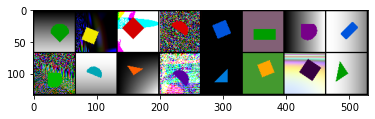

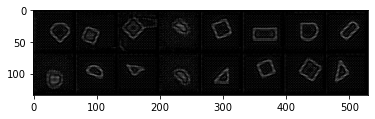

    Linprob Eval @LR: 0.49 @KNN: 0.50


Epoch [ 37/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=149, geo_1=194, geo_2=196, stl_1=103, stl_2=102]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


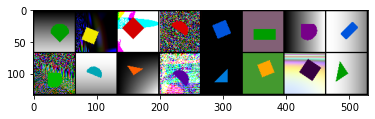

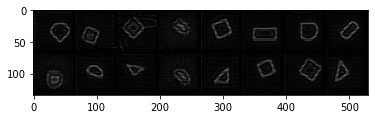

    Linprob Eval @LR: 0.50 @KNN: 0.50


Epoch [ 38/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=148, geo_1=193, geo_2=192, stl_1=104, stl_2=104]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


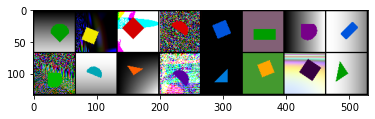

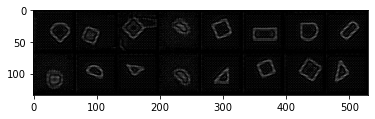

    Linprob Eval @LR: 0.51 @KNN: 0.49


Epoch [ 39/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=149, geo_1=194, geo_2=197, stl_1=101, stl_2=103]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


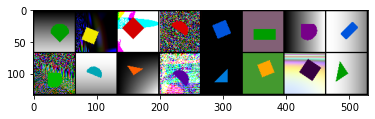

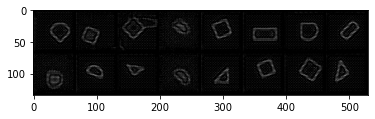

    Linprob Eval @LR: 0.51 @KNN: 0.49


Epoch [ 40/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=148, geo_1=195, geo_2=192, stl_1=102, stl_2=101]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


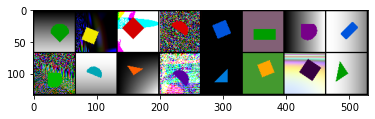

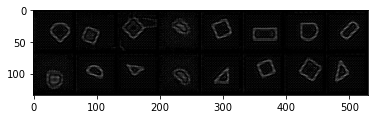

    Linprob Eval @LR: 0.51 @KNN: 0.50


Epoch [ 41/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=147, geo_1=189, geo_2=190, stl_1=105, stl_2=104]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


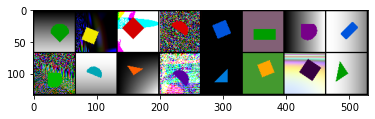

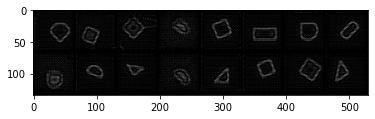

    Linprob Eval @LR: 0.51 @KNN: 0.49


Epoch [ 42/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=149, geo_1=198, geo_2=193, stl_1=103, stl_2=103]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


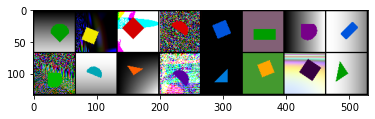

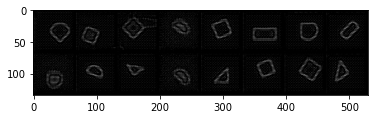

    Linprob Eval @LR: 0.51 @KNN: 0.50


Epoch [ 43/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=146, geo_1=189, geo_2=191, stl_1=101, stl_2=102]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


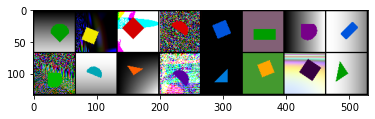

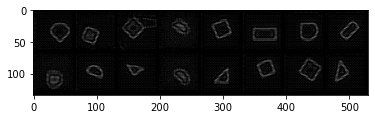

    Linprob Eval @LR: 0.51 @KNN: 0.50


Epoch [ 44/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=148, geo_1=192, geo_2=190, stl_1=102, stl_2=106]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


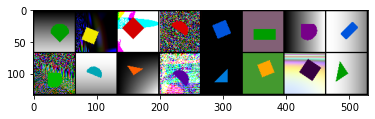

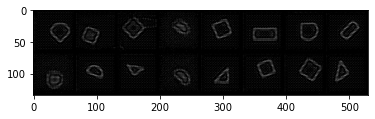

    Linprob Eval @LR: 0.52 @KNN: 0.50


Epoch [ 45/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=146, geo_1=189, geo_2=190, stl_1=103, stl_2=100]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


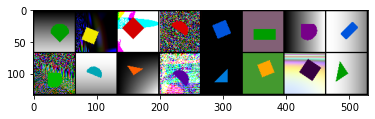

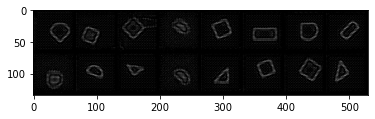

    Linprob Eval @LR: 0.52 @KNN: 0.50


Epoch [ 46/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=146, geo_1=189, geo_2=190, stl_1=104, stl_2=102]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


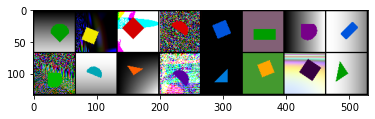

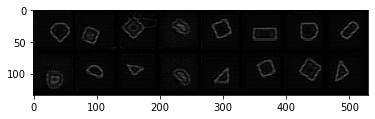

    Linprob Eval @LR: 0.51 @KNN: 0.50


Epoch [ 47/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=146, geo_1=191, geo_2=191, stl_1=101, stl_2=100]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


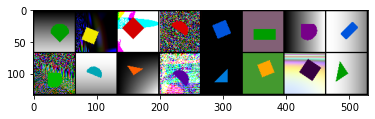

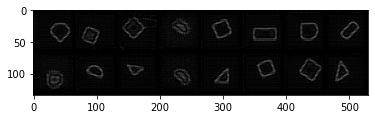

    Linprob Eval @LR: 0.52 @KNN: 0.50


Epoch [ 48/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=145, geo_1=189, geo_2=189, stl_1=102, stl_2=100]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


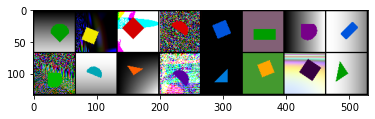

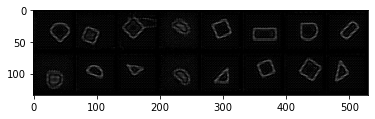

    Linprob Eval @LR: 0.53 @KNN: 0.50


Epoch [ 49/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=143, geo_1=186, geo_2=187, stl_1=99.1, stl_2=101]        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


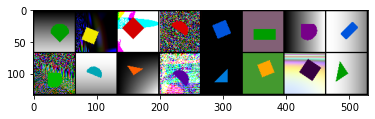

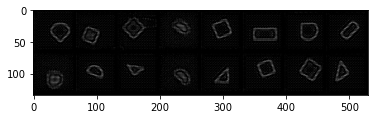

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 50/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=143, geo_1=186, geo_2=187, stl_1=101, stl_2=99]          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


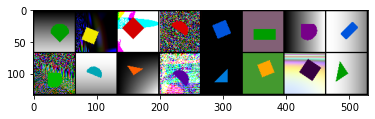

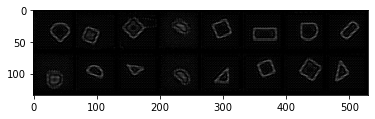

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 51/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=143, geo_1=187, geo_2=188, stl_1=99.3, stl_2=99.9]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


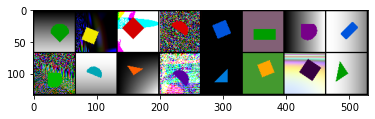

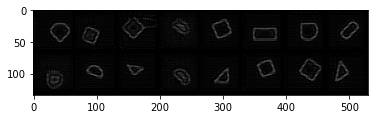

    Linprob Eval @LR: 0.53 @KNN: 0.50


Epoch [ 52/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=143, geo_1=188, geo_2=187, stl_1=99.1, stl_2=98.9]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


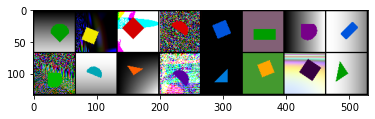

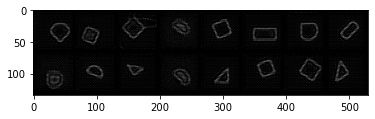

    Linprob Eval @LR: 0.53 @KNN: 0.50


Epoch [ 53/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=143, geo_1=186, geo_2=188, stl_1=101, stl_2=98.9]        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


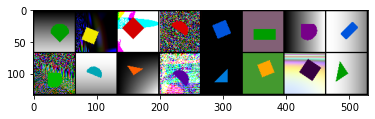

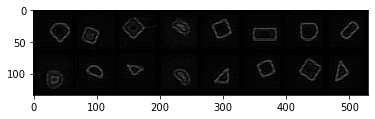

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 54/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=142, geo_1=187, geo_2=185, stl_1=99.8, stl_2=95.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


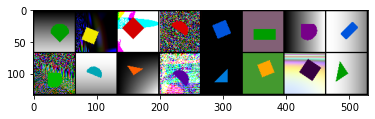

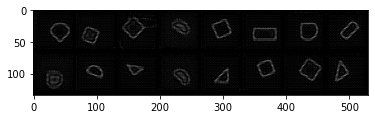

    Linprob Eval @LR: 0.53 @KNN: 0.50


Epoch [ 55/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=141, geo_1=181, geo_2=184, stl_1=101, stl_2=98.4]        
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


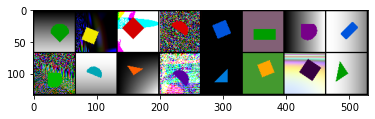

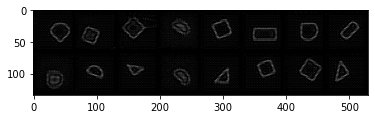

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 56/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=142, geo_1=186, geo_2=186, stl_1=97.8, stl_2=98.2]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


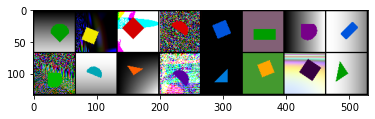

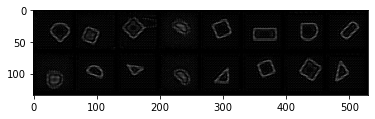

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 57/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=143, geo_1=188, geo_2=188, stl_1=98.3, stl_2=99.2]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


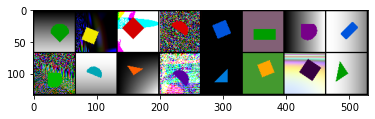

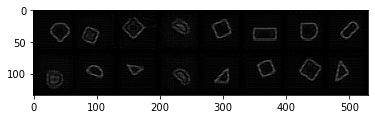

    Linprob Eval @LR: 0.53 @KNN: 0.50


Epoch [ 58/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=142, geo_1=186, geo_2=185, stl_1=98.1, stl_2=97.9]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


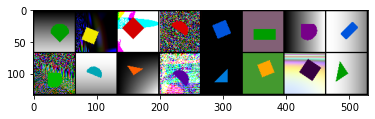

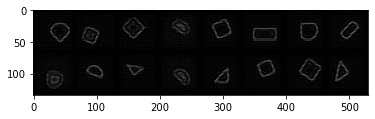

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 59/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=140, geo_1=182, geo_2=183, stl_1=97.8, stl_2=95.6]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


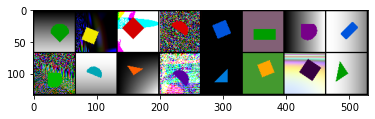

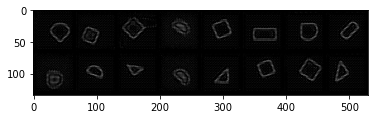

    Linprob Eval @LR: 0.55 @KNN: 0.49


Epoch [ 60/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=141, geo_1=184, geo_2=184, stl_1=99, stl_2=98.1]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


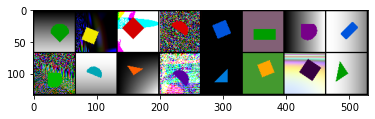

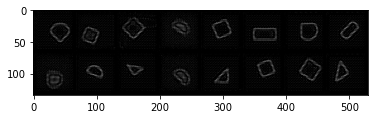

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 61/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=141, geo_1=185, geo_2=184, stl_1=96.9, stl_2=96.2]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


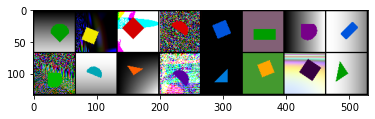

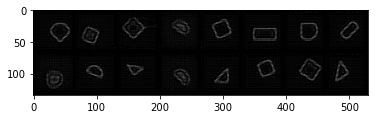

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 62/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=140, geo_1=185, geo_2=185, stl_1=93.8, stl_2=97.1]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


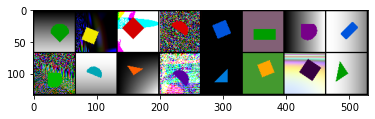

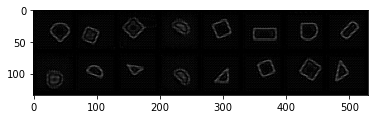

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 63/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=141, geo_1=186, geo_2=184, stl_1=95.9, stl_2=97.5]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


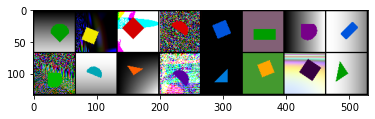

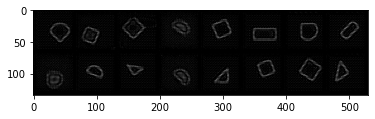

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 64/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=142, geo_1=187, geo_2=187, stl_1=97.8, stl_2=95.1]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


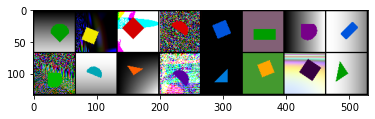

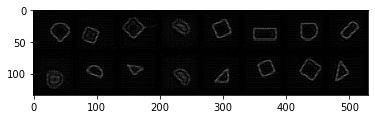

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 65/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=141, geo_1=184, geo_2=183, stl_1=95.6, stl_2=99.2]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


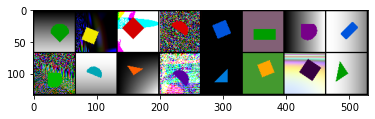

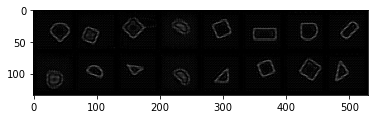

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 66/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=139, geo_1=182, geo_2=181, stl_1=96.3, stl_2=96.4]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


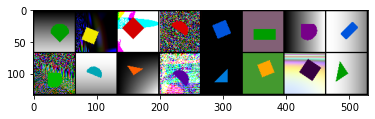

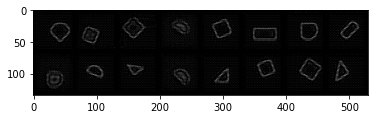

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 67/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=138, geo_1=180, geo_2=181, stl_1=96.7, stl_2=94.5]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


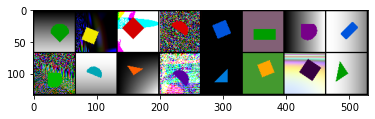

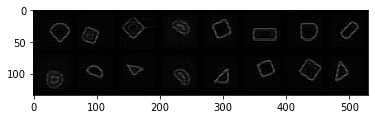

    Linprob Eval @LR: 0.56 @KNN: 0.50


Epoch [ 68/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=141, geo_1=184, geo_2=184, stl_1=97.5, stl_2=96.7]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


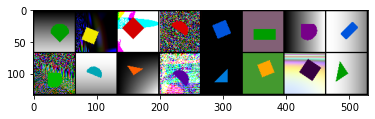

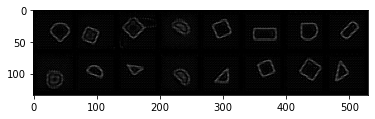

    Linprob Eval @LR: 0.54 @KNN: 0.50


Epoch [ 69/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=137, geo_1=182, geo_2=180, stl_1=93.2, stl_2=94.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


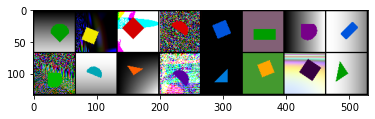

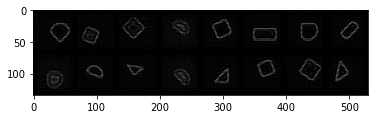

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 70/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=137, geo_1=178, geo_2=180, stl_1=95, stl_2=94.4]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


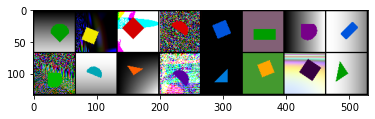

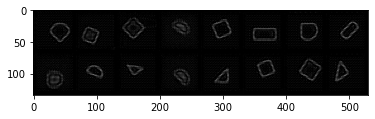

    Linprob Eval @LR: 0.55 @KNN: 0.50


Epoch [ 71/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=137, geo_1=181, geo_2=180, stl_1=94, stl_2=95]           
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


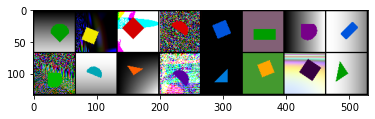

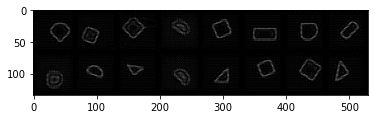

    Linprob Eval @LR: 0.56 @KNN: 0.51


Epoch [ 72/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=139, geo_1=178, geo_2=181, stl_1=96.3, stl_2=99.6]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


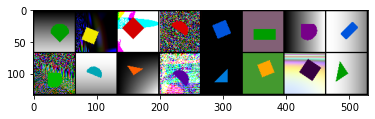

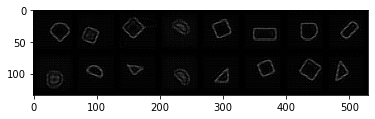

    Linprob Eval @LR: 0.56 @KNN: 0.51


Epoch [ 73/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=137, geo_1=179, geo_2=178, stl_1=94.8, stl_2=95.1]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


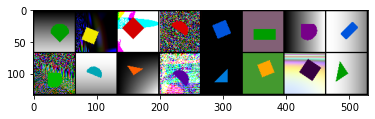

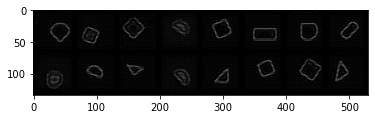

    Linprob Eval @LR: 0.57 @KNN: 0.51


Epoch [ 74/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=138, geo_1=181, geo_2=181, stl_1=94.8, stl_2=96.7]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


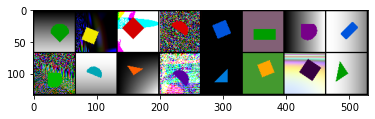

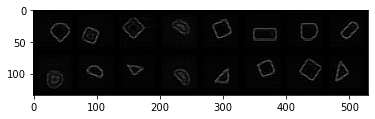

    Linprob Eval @LR: 0.56 @KNN: 0.50


Epoch [ 75/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=139, geo_1=184, geo_2=182, stl_1=95.6, stl_2=96.4]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


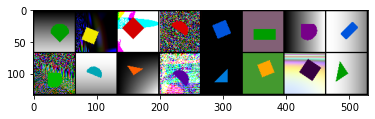

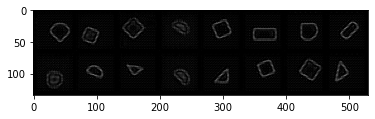

    Linprob Eval @LR: 0.56 @KNN: 0.50


Epoch [ 76/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=138, geo_1=183, geo_2=181, stl_1=93.4, stl_2=96]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


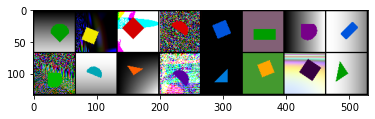

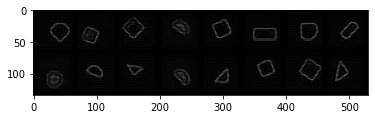

    Linprob Eval @LR: 0.57 @KNN: 0.50


Epoch [ 77/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=136, geo_1=177, geo_2=177, stl_1=95.2, stl_2=93.9]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


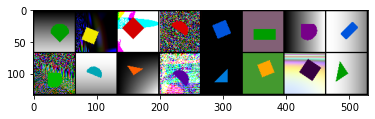

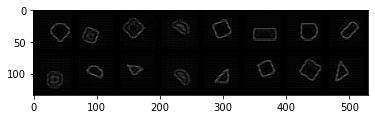

    Linprob Eval @LR: 0.56 @KNN: 0.50


Epoch [ 78/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=137, geo_1=179, geo_2=179, stl_1=95, stl_2=93.9]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


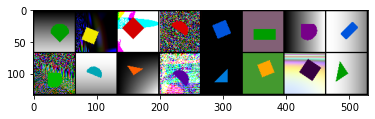

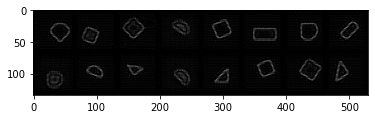

    Linprob Eval @LR: 0.57 @KNN: 0.51


Epoch [ 79/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=137, geo_1=179, geo_2=180, stl_1=94.7, stl_2=93.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


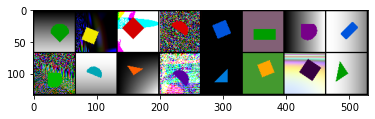

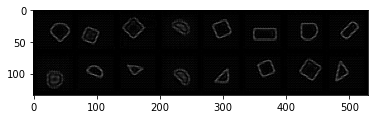

    Linprob Eval @LR: 0.58 @KNN: 0.50


Epoch [ 80/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=136, geo_1=177, geo_2=179, stl_1=94.1, stl_2=94.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


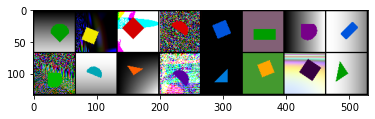

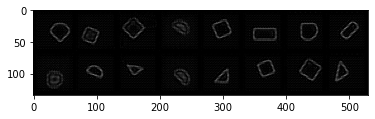

    Linprob Eval @LR: 0.57 @KNN: 0.50


Epoch [ 81/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=135, geo_1=178, geo_2=177, stl_1=91.2, stl_2=92.6]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


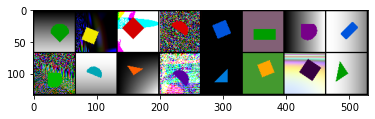

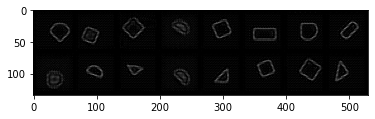

    Linprob Eval @LR: 0.57 @KNN: 0.51


Epoch [ 82/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=136, geo_1=177, geo_2=179, stl_1=94.3, stl_2=94.3]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


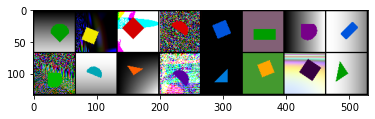

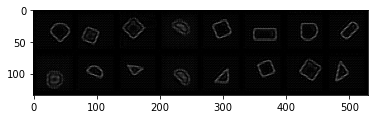

    Linprob Eval @LR: 0.58 @KNN: 0.50


Epoch [ 83/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=136, geo_1=177, geo_2=179, stl_1=94.7, stl_2=94.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


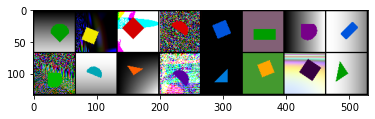

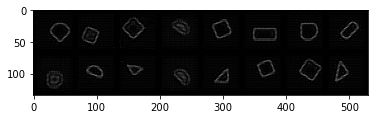

    Linprob Eval @LR: 0.57 @KNN: 0.50


Epoch [ 84/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=136, geo_1=179, geo_2=178, stl_1=94.8, stl_2=93.2]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


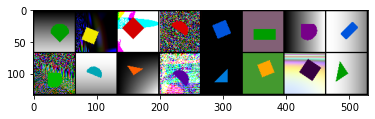

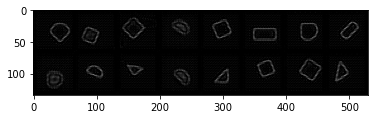

    Linprob Eval @LR: 0.57 @KNN: 0.51


Epoch [ 85/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=137, geo_1=180, geo_2=180, stl_1=93.2, stl_2=94.9]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


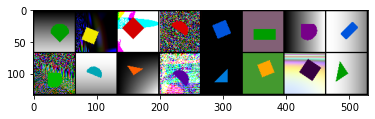

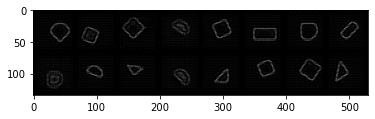

    Linprob Eval @LR: 0.57 @KNN: 0.50


Epoch [ 86/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=140, geo_1=186, geo_2=187, stl_1=94.4, stl_2=94.1]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


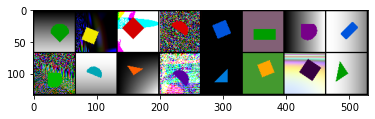

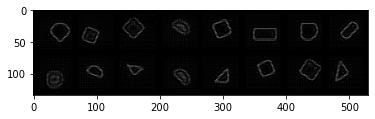

    Linprob Eval @LR: 0.57 @KNN: 0.51


Epoch [ 87/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=135, geo_1=177, geo_2=177, stl_1=91.9, stl_2=93.3]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


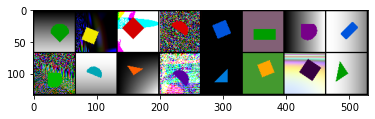

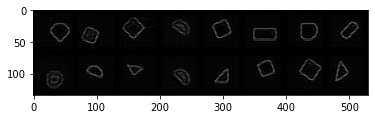

    Linprob Eval @LR: 0.57 @KNN: 0.51


Epoch [ 88/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=135, geo_1=176, geo_2=178, stl_1=93.9, stl_2=91.3]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


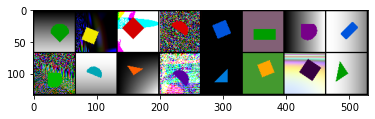

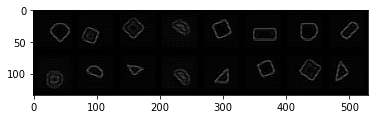

    Linprob Eval @LR: 0.58 @KNN: 0.51


Epoch [ 89/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=135, geo_1=177, geo_2=178, stl_1=91.9, stl_2=95]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


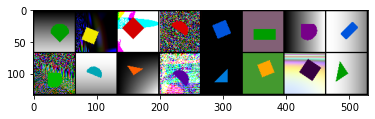

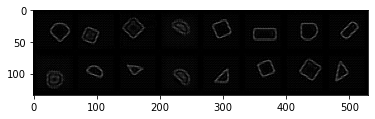

    Linprob Eval @LR: 0.58 @KNN: 0.52


Epoch [ 90/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=135, geo_1=177, geo_2=176, stl_1=94, stl_2=94.1]         
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


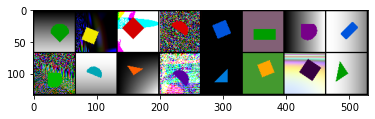

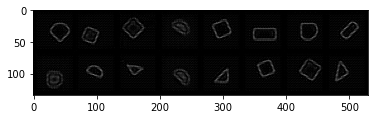

    Linprob Eval @LR: 0.58 @KNN: 0.51


Epoch [ 91/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=134, geo_1=175, geo_2=175, stl_1=93.5, stl_2=93.3]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


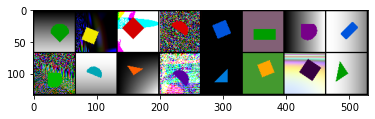

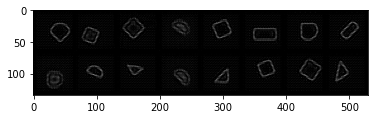

    Linprob Eval @LR: 0.57 @KNN: 0.51


Epoch [ 92/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=136, geo_1=178, geo_2=179, stl_1=93.4, stl_2=94.2]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


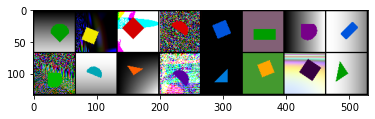

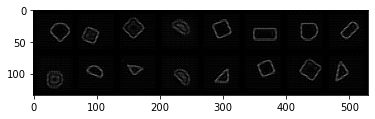

    Linprob Eval @LR: 0.58 @KNN: 0.51


Epoch [ 93/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=136, geo_1=179, geo_2=179, stl_1=91.9, stl_2=94.5]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


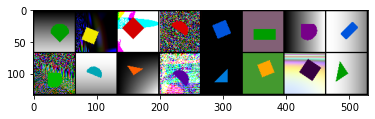

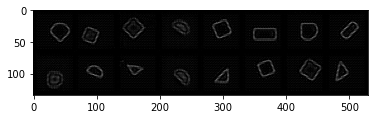

    Linprob Eval @LR: 0.58 @KNN: 0.51


Epoch [ 94/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=135, geo_1=176, geo_2=179, stl_1=93.6, stl_2=91.4]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


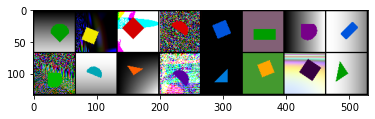

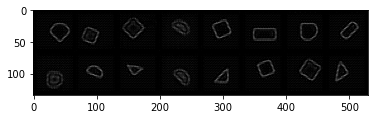

    Linprob Eval @LR: 0.58 @KNN: 0.51


Epoch [ 95/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=134, geo_1=176, geo_2=178, stl_1=91.8, stl_2=90.2]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


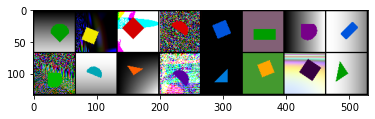

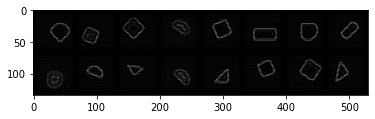

    Linprob Eval @LR: 0.58 @KNN: 0.52


Epoch [ 96/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=135, geo_1=179, geo_2=179, stl_1=91, stl_2=90]           
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


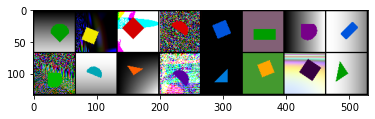

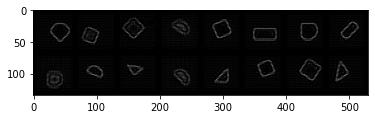

    Linprob Eval @LR: 0.59 @KNN: 0.51


Epoch [ 97/100] train:██████████| 175/175 [00:54<00:00,  3.21it/s, loss=133, geo_1=175, geo_2=173, stl_1=92.8, stl_2=92.1]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


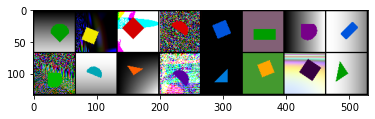

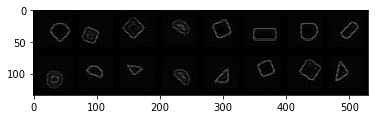

    Linprob Eval @LR: 0.58 @KNN: 0.51


Epoch [ 98/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=134, geo_1=177, geo_2=176, stl_1=89.7, stl_2=91.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


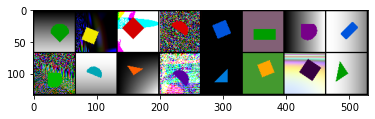

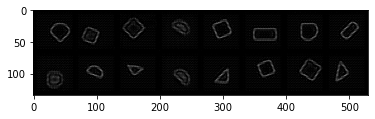

    Linprob Eval @LR: 0.59 @KNN: 0.51


Epoch [ 99/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=135, geo_1=178, geo_2=179, stl_1=91.5, stl_2=90.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


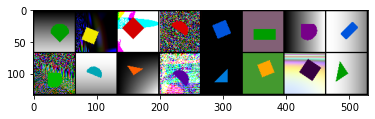

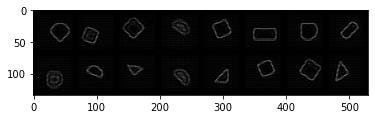

    Linprob Eval @LR: 0.58 @KNN: 0.51


Epoch [100/100] train:██████████| 175/175 [00:54<00:00,  3.20it/s, loss=134, geo_1=177, geo_2=178, stl_1=91.5, stl_2=90.8]       
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


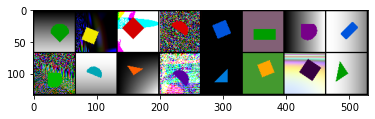

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


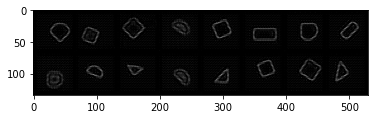

    Linprob Eval @LR: 0.59 @KNN: 0.51


In [32]:
global_step = 0
for epoch_idx in range(1, config.num_epochs + 1, 1):
    ################2
    # TRAIN
    ################
    model.train()
    epoch_step = 0
    epoch_loss = 0
   
    desc = "Epoch [{:3}/{:3}] {}:".format(epoch_idx, config.num_epochs, 'train')
    pbar = tqdm(dl_train, bar_format= desc + '{bar:10}{r_bar}{bar:-10b}')
    #
    for (x11, x12, x21, x22), _ in pbar:
        x11 = x11.to(device)
        x12 = x12.to(device)
        x21 = x21.to(device)
        x22 = x22.to(device)
        #
        for param in model.parameters():
            param.grad = None
        loss, geo_1112_loss, geo_2122_loss, stl_1121_loss, stl_1222_loss = model(x11, x12, x21, x22)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        epoch_step += 1
        global_step += 1
        #
        pbar.set_postfix({'loss': loss.item(),
                          "geo_1": geo_1112_loss.item(),
                          "geo_2": geo_2122_loss.item(),
                          "stl_1": stl_1121_loss.item(),
                          "stl_2": stl_1222_loss.item()
                         })

    stats.train.loss.append(epoch_loss / epoch_step)
    stats.train.epoch.append(epoch_idx)
    
    ################
    # Visualize
    ################
    if epoch_idx % config.freqs.show == 0 or epoch_idx == config.num_epochs:
        model.eval()
        with torch.no_grad():
            z_stl, z_geo, _ = model.unet(x_vis.to(device))
        visualize(x_vis, z_geo, config.n_vis)
        model.train()
    
    ################
    # Linprob
    ################
    if epoch_idx % config.freqs.linprob == 0 or epoch_idx == config.num_epochs:
        model.eval()
        R = []
        Y = []
        with torch.no_grad():
            for x, y in dl_linprob:
                x = x.to(device)
                r, _,_ = model.unet(x)
                r = r.flatten(start_dim=1)
                R.append(r.detach().cpu().numpy())
                Y.append(y.cpu().numpy())
        R = np.concatenate(R)
        Y = np.concatenate(Y)
        #
        knn = KNeighborsClassifier(n_neighbors=5)
        knn.fit(R, Y)
        knnacc = knn.score(R, Y)
        #
        clf = LogisticRegression(random_state=0, tol=0.001, max_iter=200).fit(R, Y)
        linacc = clf.score(R, Y)
        print("    Linprob Eval @LR: {:.2f} @KNN: {:.2f}".format(linacc, knnacc))
        stats.linprob.epoch.append(epoch_idx)
        stats.linprob.knnacc.append(knnacc)
        stats.linprob.linacc.append(linacc)
        model.train()

## Plot

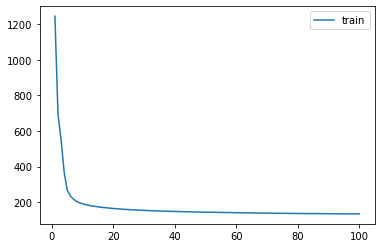

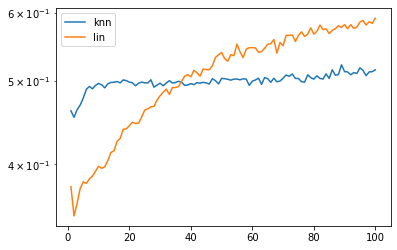

In [33]:
# plot losses
plt.plot(stats.train.epoch, stats.train.loss, label="train")
plt.legend()
plt.savefig(p_experiment / "barlow_loss.png")
plt.show()


# plot linprob loss
#plt.plot(stats.linprob.epoch, stats.linprob.loss, label="train")
#plt.legend()
#plt.savefig(p_experiment / "linprob_loss.png")
#plt.show()

# plot linprob acc
plt.plot(stats.linprob.epoch, stats.linprob.knnacc, label="knn")
plt.plot(stats.linprob.epoch, stats.linprob.linacc, label="lin")
plt.yscale("log")
plt.legend()
plt.savefig(p_experiment / "linprob_acc.png")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


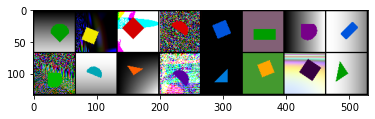

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


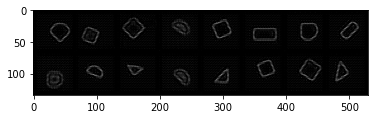

In [34]:
model.eval()
with torch.no_grad():
    z_stl, z_geo, _ = model.unet(x_vis.to(device))
visualize(x_vis, z_geo, config.n_vis)

In [35]:
z = np.squeeze(z_geo.permute((0, 2, 3, 1)).cpu().numpy())

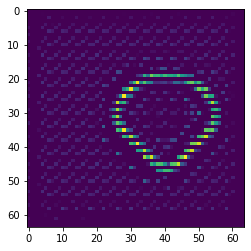

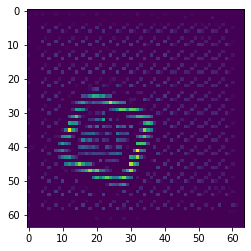

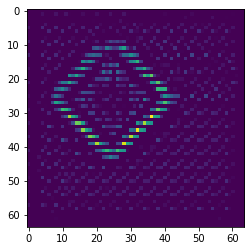

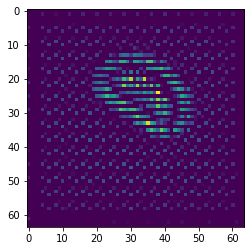

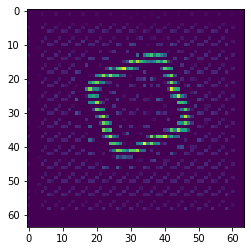

...

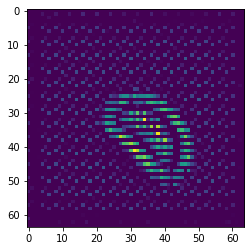

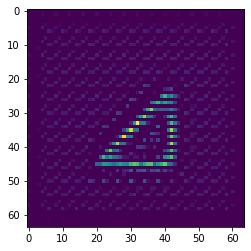

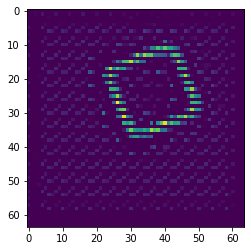

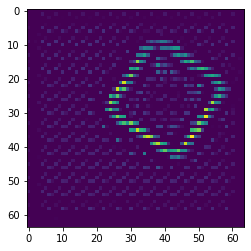

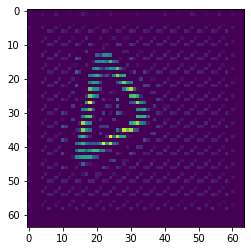

In [36]:
for zi in z:
    plt.imshow(zi)
    plt.show()

In [37]:
# dl_train
(x11, x12, x21, x22),_ = next(iter(dl_train))

In [38]:
z_stl_11, z_geo_11, _ = model.unet(x11.to(device))
z_stl_12, z_geo_12, _ = model.unet(x12.to(device))
z_stl_22, z_geo_22, _ = model.unet(x22.to(device))
z_stl_21, z_geo_21, _ = model.unet(x21.to(device))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


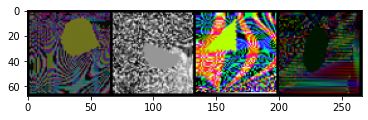

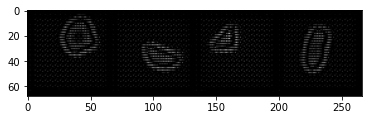

In [39]:
visualize(x11, z_geo_11, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


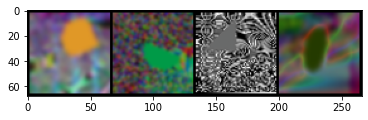

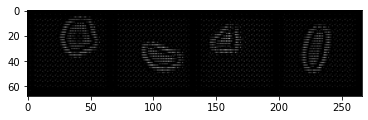

In [40]:
visualize(x12, z_geo_12, 4)Vorlesung vorbereiten 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


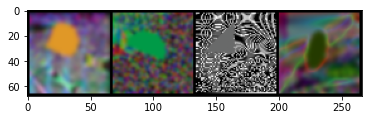

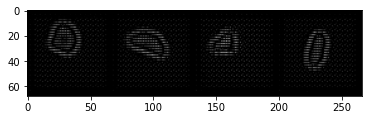

In [41]:
Vorlesung vorbereiten Vorlesung vorbereiten visualize(x22, z_geo_22, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


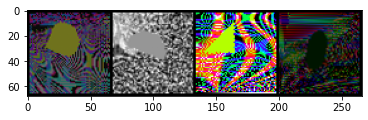

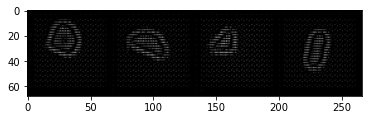

In [42]:
visualize(x21, z_geo_21, 4)

In [43]:
z = z_geo_21.detach().cpu().numpy()

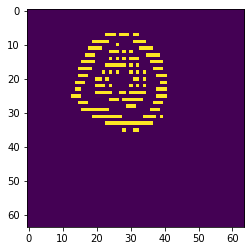

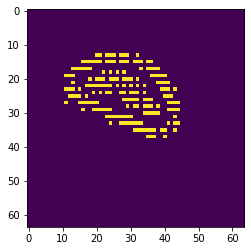

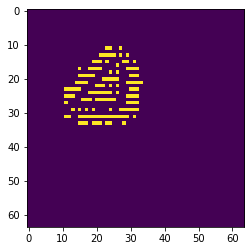

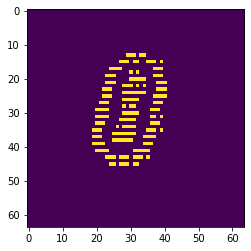

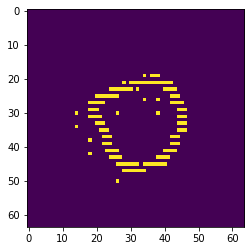

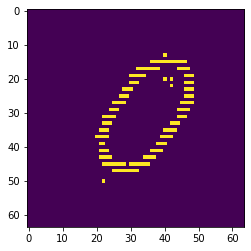

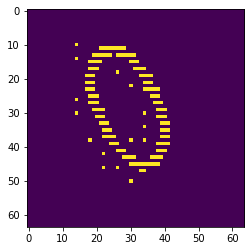

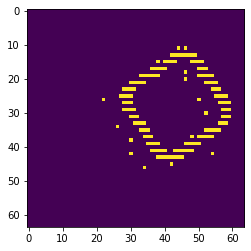

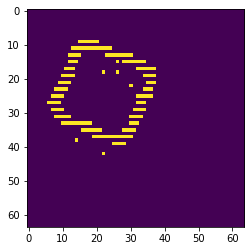

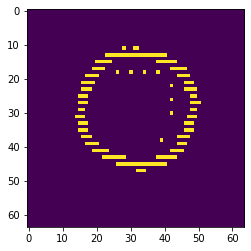

In [47]:
for zi in z[:10]:
    plt.imshow(np.squeeze(zi) > 0.2)
    plt.show()